### This notebook is used to perform integration of the three mouse intenstinal stem cell datasets using the harmony approach. 

**The data loaded have been preprocessed by the procedures decribed in other scripts and notebooks. Clusters that were annotated as panreatic cells or other unknown types have been removed.**

In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import warnings
warnings.filterwarnings("ignore")

import scanpy as sc
from pyrovelocity import cytotrace
import numpy as np

import PlotGenerators as helper
import importlib
importlib.reload(helper)

<module 'PlotGenerators' from '/Users/wug/git/bmi_isc_analysis/Python/PlotGenerators.py'>

In [2]:
# Run the merge based on harmony
filename = '../resources/adata_12_frozen.h5ad'
adata_e12 = sc.read_h5ad(filename)
print('E12.5 data:\n{}'.format(adata_e12))
filename = '../resources/adata_15_frozen.h5ad'
adata_e15 = sc.read_h5ad(filename)
print('E15.5 data:\n{}'.format(adata_e15))
filename = '../resources/adata_17_frozen.h5ad'
adata_e17 = sc.read_h5ad(filename)
print('E17.5 data:\n{}'.format(adata_e17))


E12.5 data:
AnnData object with n_obs × n_vars = 4210 × 17800
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CytoTRACE', 'leiden', 'dpt_pseudotime'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'diffmap_evals', 'hvg', 'iroot', 'leiden', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_aucell', 'X_diffmap', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts'
    obsp: 'connectivities', 'distances'
E15.5 data:
AnnData object with n_obs × n_vars = 6513 × 19513
    obs: 'scrublet_doublet_score', 'scrublet_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 

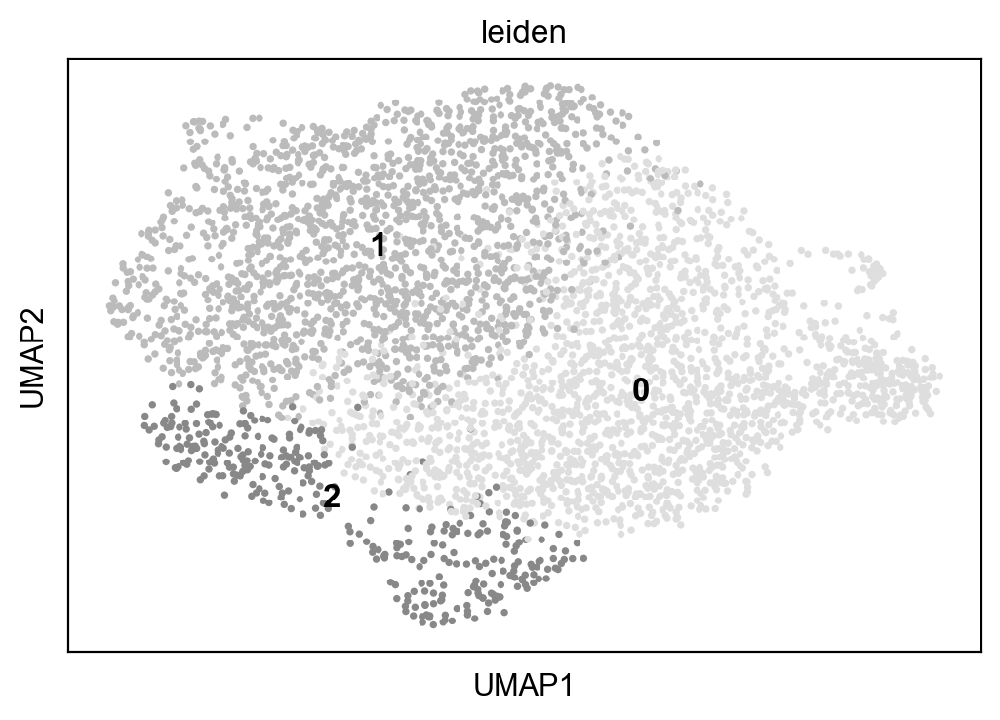

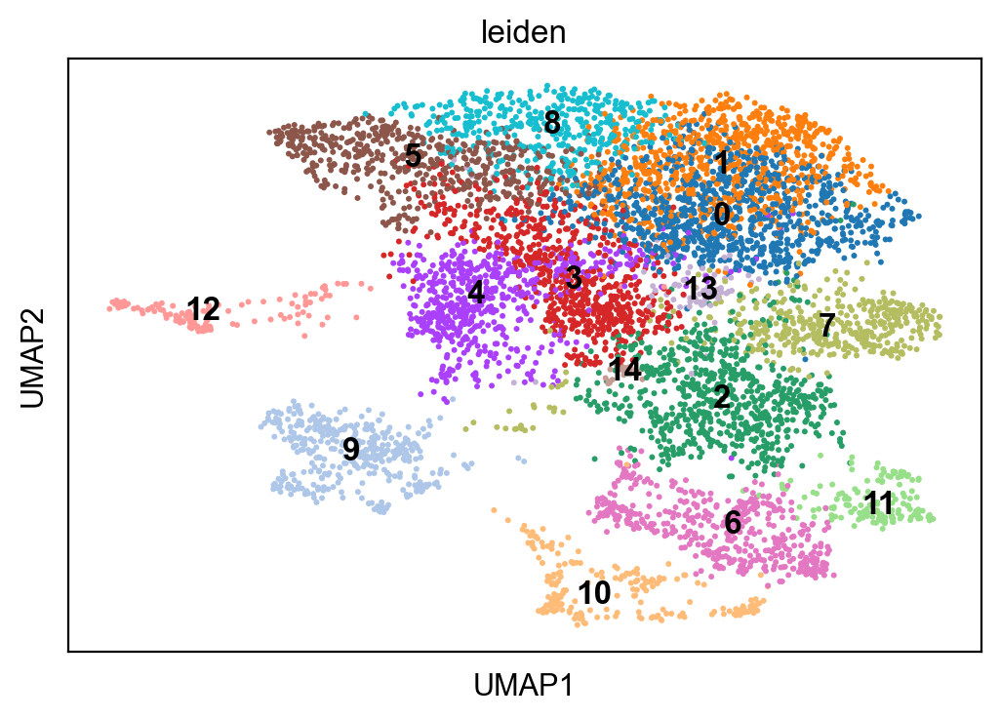

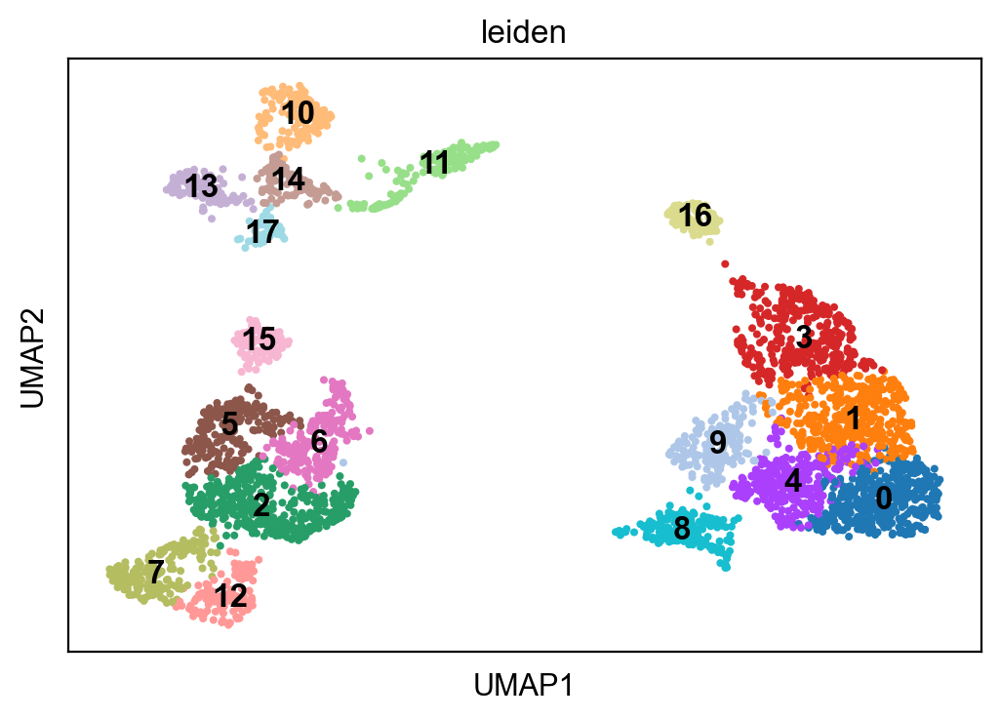

In [3]:
sc.pl.umap(adata_e12, color='leiden', legend_loc='on data')
sc.pl.umap(adata_e15, color='leiden', legend_loc='on data')
sc.pl.umap(adata_e17, color='leiden', legend_loc='on data')

In [4]:
# # Want to keep the original clustering results
adata_e12.obs['leiden_E12'] = adata_e12.obs['leiden']
adata_e15.obs['leiden_E15'] = adata_e15.obs['leiden']
adata_e17.obs['leiden_E17'] = adata_e17.obs['leiden']
# Most likely we should re-generate a list of highly variable genes for PCA. Otherwise, the original ones,
# which were specific to individual datasets, will be used for PCA. In this case, this may not make sense.
_, _, adata_merged = helper.merge(adata_e12, 
                                  [adata_e15, adata_e17], 
                                  batch_categories=['E12.5', 'E15.5', 'E17.5'], 
                                  batch_correction='harmony',
                                  re_run_highly_variable_genes=True) 

2023-10-02 17:31:09,017 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-10-02 17:31:13,040 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-10-02 17:31:13,130 - harmonypy - INFO - Iteration 1 of 10
2023-10-02 17:31:16,304 - harmonypy - INFO - Iteration 2 of 10
2023-10-02 17:31:19,611 - harmonypy - INFO - Converged after 2 iterations


2023-10-02 17:31:27.190636: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


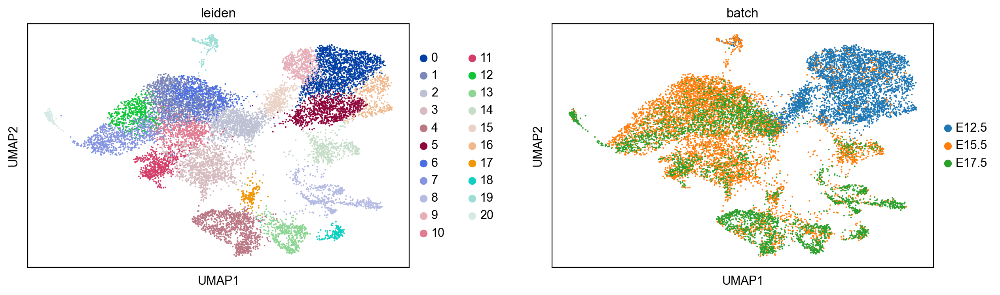

In [5]:
# Need to re-run clustering
helper.run_umap_via_paga(adata_merged, use_rep = 'X_pca_harmony')
sc.pl.umap(adata_merged, color=['leiden', 'batch'], wspace=0.25)

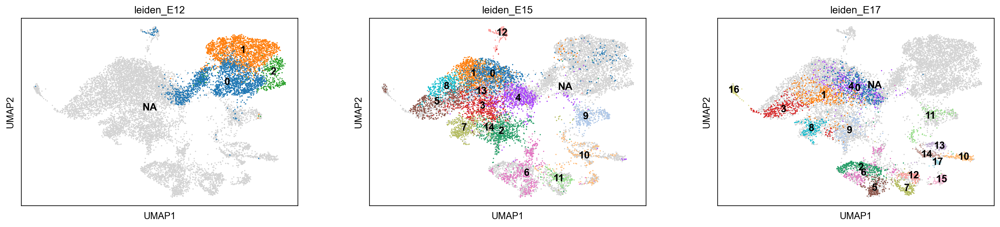

In [6]:
sc.pl.umap(adata_merged, color=['leiden_E12', 'leiden_E15', 'leiden_E17'], legend_loc='on data')

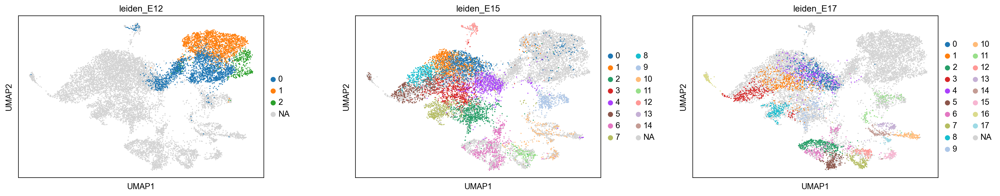

In [7]:
sc.pl.umap(adata_merged, color=['leiden_E12', 'leiden_E15', 'leiden_E17'], wspace=0.25)

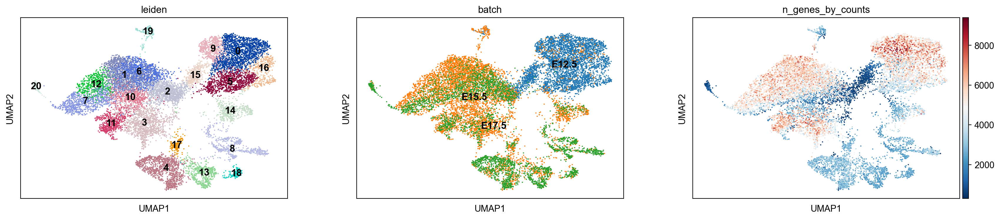

In [8]:
sc.pl.umap(adata_merged, color=['leiden', 'batch', 'n_genes_by_counts'], legend_loc='on data')

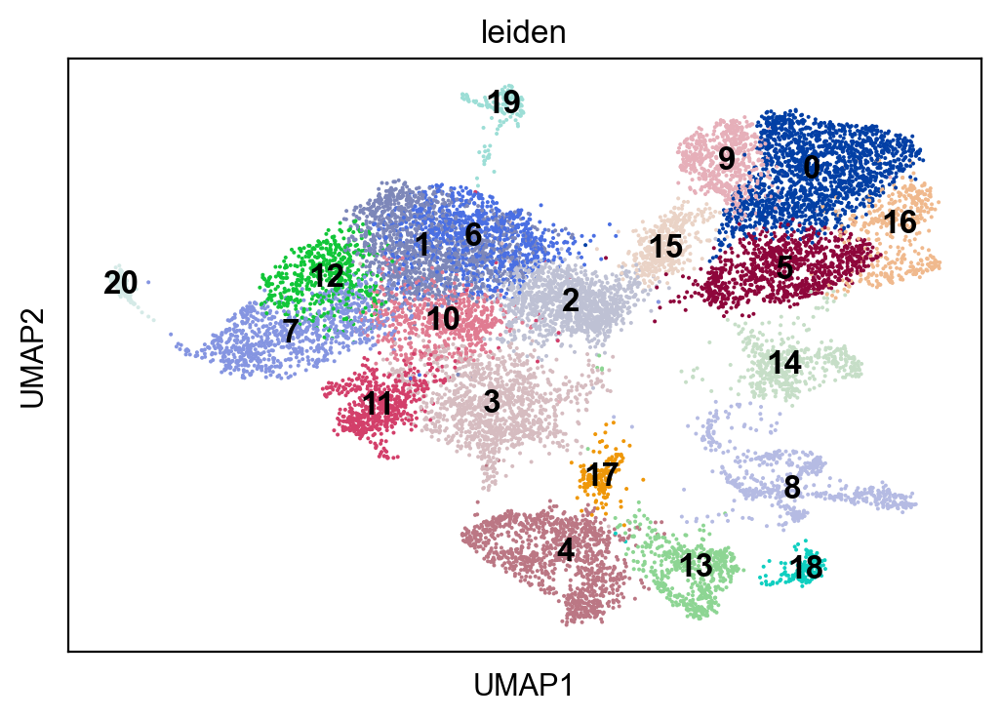

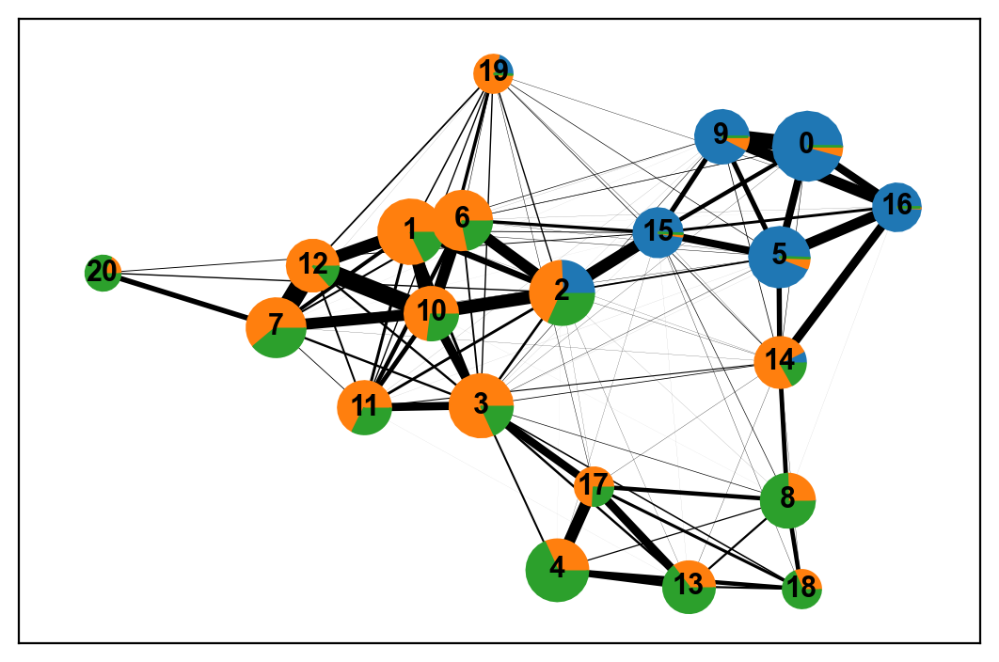

In [9]:
sc.pl.umap(adata_merged, color=['leiden'], legend_loc='on data')
sc.pl.paga(adata_merged, pos=adata_merged.uns['paga']['pos'], threshold=0, color='batch', node_size_scale=3)

In [10]:
DIR_NAME = '/Volumes/ssd/results/missy_sc_rna/bmi1/E15.5/'
# filename = DIR_NAME + 'harmony_12_15_17_pan_cells_filtered_072623.h5ad'
# filename = DIR_NAME + 'harmony_12_15_17_pan_cells_filtered_080723.h5ad'
# filename = DIR_NAME + 'harmony_12_15_17_pan_cells_filtered_080823.h5ad'
# filename = DIR_NAME + 'harmony_12_15_17_pan_cells_filtered_091423.h5ad'
# filename = DIR_NAME + 'harmony_12_15_17_pan_cells_filtered_092123.h5ad'
filename = DIR_NAME + 'harmony_12_15_17_pan_cells_filtered_100223.h5ad'
sc.write(filename, adata_merged)

In [11]:
cytotrace_results = cytotrace.cytotrace(adata=adata_merged, layer="raw", solver='fnnls')
adata_merged.obs['pyrovelocity_cytotrace'] = cytotrace_results['CytoTRACE']

# Try the DPT
root_cell = adata_merged.obs['pyrovelocity_cytotrace'].sort_values(ascending=False)[:1].index[0]
root_index = np.flatnonzero(adata_merged.obs_names == root_cell)[0]
adata_merged.uns['iroot'] = root_index
sc.tl.dpt(adata_merged)

processing: 29.36227512359619
markov: 21.079012870788574
gcs: 4.152724027633667
fnnls
regression: 81.48731303215027
diffusion:4.51775598526001 
genes:3.7591419219970703


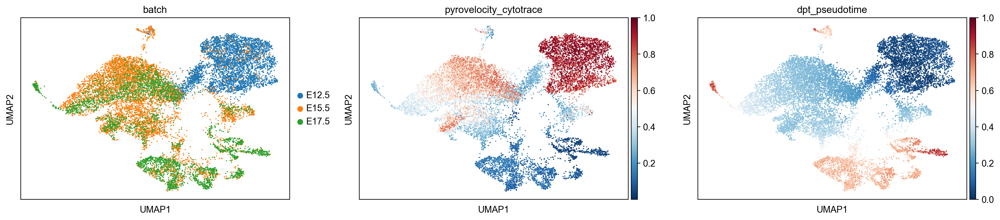

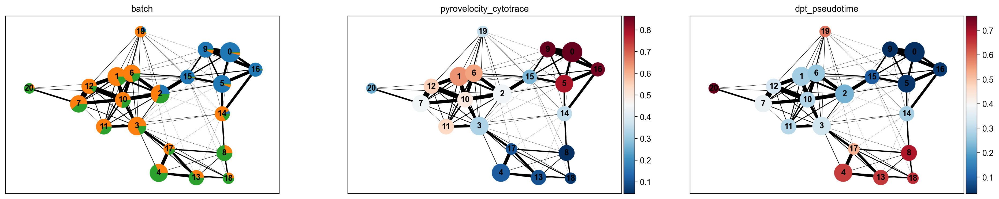

In [12]:
sc.pl.umap(adata_merged, color=['batch', 'pyrovelocity_cytotrace', 'dpt_pseudotime'])
sc.pl.paga(adata_merged, pos=adata_merged.uns['paga']['pos'], color=['batch', 'pyrovelocity_cytotrace', 'dpt_pseudotime'], node_size_scale=3)

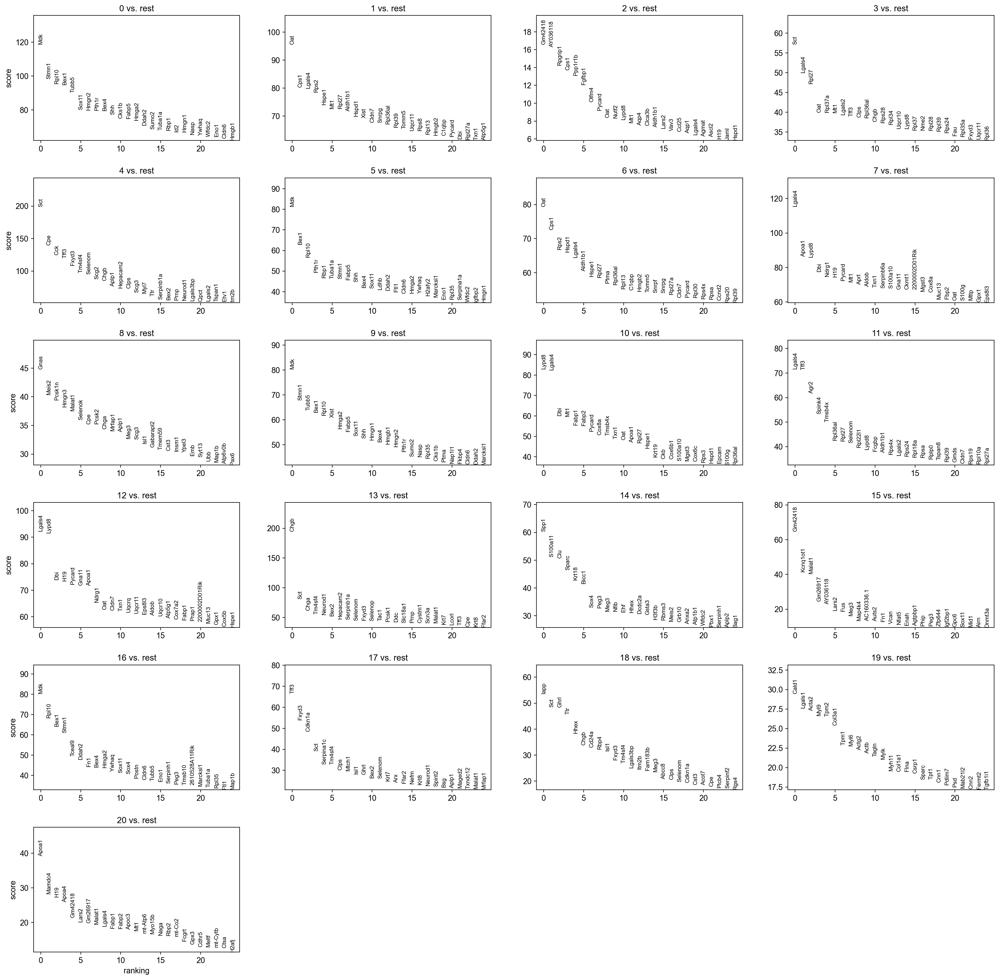

(22077, 6)
group
2       23
10     314
3      339
20     396
15     433
11     468
6      729
5      926
18     945
1      992
19    1097
9     1155
0     1294
17    1301
16    1400
7     1536
12    1639
14    1683
13    1739
8     1752
4     1916
Name: names, dtype: int64


In [13]:
# Analyze markers for the merged data
save_plot = '_merged_data_100223.pdf'
save_markers = DIR_NAME + 'markers_E12.5_E15.5_E17.5_harmony_100223.csv'
helper.analyze_markers(adata_merged, 
                       save_plot, 
                       save_markers, 
                       pval_cutoff=0.05,
                       log2fc_min=1)